In [1]:
# library 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

import os 
import datetime 
import plotly.express as px
import contextily as cx
import fsspec 
import pystac 
import xarray as xr

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import RobustScaler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, confusion_matrix, roc_curve, auc,classification_report

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xarray/backends/cfgrib_.py:27: UserWarning: Failed to load cfgrib - most likely there is a problem accessing the ecCodes library. Try `import cfgrib` to get the full error message
  warnings.warn(


## Read in the target dataset 


In [2]:
path = os.path.join("Level_1_GBIF_training_data","occurrence.txt")
columns = [
        'gbifID','eventDate','country','continent','stateProvince',
        'decimalLatitude','decimalLongitude','species'
]
country_names = {
        'AU':'Australia', 'CR':'Costa Rica', 'ZA':'South Africa','MX':'Mexico','HN':'Honduras',
        'MZ':'Mozambique','BW':'Botswana','MW':'Malawi','CO':'Colombia','PA':'Panama','NI':'Nicaragua',
        'BZ':'Belize','ZW':'Zimbabwe','SZ':'Eswatini','ZM':'Zambia','GT':'Guatemala','LS':'Lesotho',
        'SV':'El Salvador', 'AO':'Angola', np.nan:'unknown or invalid'
}
continent_names = {
    'AU':'Australia', 'CR':'Central America', 'ZA':'Africa','MX':'Central America','HN':'Central America',
    'MZ':'Africa','BW':'Africa','MW':'Africa','CO':'Central America','PA':'Central America',
    'NI':'Central America','BZ':'Central America','ZW':'Africa','SZ':'Africa','ZM':'Africa',
    'GT':'Central America','LS':'Africa','SV':'Central America','AO':'Africa', np.nan:'unknown or invalid' 
}
df = pd.read_csv(path, sep='\t').assign(
            country =  lambda x: x.countryCode.map(country_names),
            continent =  lambda x: x.countryCode.map(continent_names),
            species = lambda x: x.species.str.title())[columns]
df.head()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3369: DtypeWarning: Columns (2,9,35,39,42,46,47,48,54,56,57,58,59,60,62,64,65,66,68,69,70,71,74,75,76,77,78,79,82,84,85,86,87,88,89,90,92,96,97,99,101,103,109,110,111,114,115,116,117,118,119,120,121,122,123,126,127,128,129,130,135,136,142,143,145,147,148,149,150,151,161,165,170,172,173,174,175,176,177,178,179,180,181,185,189,190,191,192,193,195,207,210,212,215,217,225,226,242,246,254,255) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,gbifID,eventDate,country,continent,stateProvince,decimalLatitude,decimalLongitude,species
0,2574007008,2020-01-23T01:38:00,Australia,Australia,New South Wales,-32.719457,152.159267,Litoria Fallax
1,3457021422,2010-03-14T22:23:00,Costa Rica,Central America,Puntarenas,8.496999,-83.318613,Agalychnis Callidryas
2,1571195309,2014-04-11T19:51:57,Costa Rica,Central America,Heredia,10.450801,-84.068659,Agalychnis Callidryas
3,2265778539,2018-07-21T21:24:21,Costa Rica,Central America,Puntarenas,9.756705,-84.613363,Agalychnis Callidryas
4,3407962690,2021-10-29T13:57:00,Australia,Australia,Queensland,-26.714302,152.815096,Litoria Fallax


### Processing dataset 

In [3]:
def convert_datetime(col,df,year):
  df[col] = pd.to_datetime(df[col])
  df = df[df[col].dt.year >= year]
  df[col] = df[col].dt.date
  return df

df = convert_datetime("eventDate",df,2006)

/var/folders/kh/t3f3nz0s3sv8b5wd8967z8t40000gn/T/ipykernel_44325/1763773647.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].dt.date


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 135004 entries, 0 to 193784
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   gbifID            135004 non-null  int64  
 1   eventDate         135004 non-null  object 
 2   country           135004 non-null  object 
 3   continent         135004 non-null  object 
 4   stateProvince     134671 non-null  object 
 5   decimalLatitude   135004 non-null  float64
 6   decimalLongitude  135004 non-null  float64
 7   species           135004 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 9.3+ MB


In [5]:
# check if na exist 
df.isna().sum()

gbifID                0
eventDate             0
country               0
continent             0
stateProvince       333
decimalLatitude       0
decimalLongitude      0
species               0
dtype: int64

In [6]:
# check where is na in the dataset 
df[df["eventDate"].isna() | df['stateProvince'].isna()]

,gbifID,eventDate,country,continent,stateProvince,decimalLatitude,decimalLongitude,species
4691,1337978361,2015-10-13,Costa Rica,Central America,NaN,10.547559,-83.505875,Agalychnis Callidryas
4692,3389807606,2010-12-04,Costa Rica,Central America,NaN,8.658924,-83.257828,Agalychnis Callidryas
81102,2833208991,2017-03-04,South Africa,Africa,NaN,-25.438324,31.397789,Chiromantis Xerampelina
81103,2839934017,2017-05-20,Costa Rica,Central America,NaN,10.553409,-83.507724,Agalychnis Callidryas
81104,2838940647,2013-06-13,Costa Rica,Central America,NaN,10.593205,-83.527851,Agalychnis Callidryas
...,...,...,...,...,...,...,...,...
193743,2832499422,2014-02-04,Costa Rica,Central America,NaN,10.450414,-84.067987,Agalychnis Callidryas
193744,2835419042,2012-03-19,Costa Rica,Central America,NaN,10.460264,-83.767017,Agalychnis Callidryas
193745,2837447654,2020-01-18,Costa Rica,Central America,NaN,10.334023,-83.952373,Agalychnis Callidryas
193746,2839800883,2006-05-07,Costa Rica,Central America,NaN,10.622057,-83.539810,Agalychnis Callidryas


In [7]:
df.describe()

,gbifID,decimalLatitude,decimalLongitude
count,1.350040e+05,135004.000000,135004.000000
mean,2.987105e+09,-32.605726,142.348252
std,7.702868e+08,6.950842,32.248410
min,3.320324e+08,-43.609343,-99.221738
25%,2.806429e+09,-35.250866,145.354000
50%,3.463489e+09,-33.824931,150.640009
75%,3.463614e+09,-32.320600,151.335963
max,3.469585e+09,21.326178,153.630000


In [8]:
df.describe(include="object")

,eventDate,country,continent,stateProvince,species
count,135004,135004,135004,134671,135004
unique,5247,17,4,99,9
top,2010-12-17,Australia,Australia,New South Wales,Crinia Signifera
freq,1713,131772,131772,81133,80920


 We need to create a target variable litoria fallax to be 1 for its occurence and 0 for other species as absent of litoria fallax

In [9]:
# check the unique values in species 
df["species"].value_counts()

Crinia Signifera             80920
Litoria Fallax               40802
Crinia Glauerti               7984
Ranoidea Australis            1839
Agalychnis Callidryas         1205
Dendrobates Auratus           1030
Xenopus Laevis                 567
Chiromantis Xerampelina        430
Austrochaperina Pluvialis      227
Name: species, dtype: int64

Since we want to search for frog species - "Litoria Fallax" across Australia, therefore, we constrain about search to country only Australia

In [10]:
df = df[df["country"] == "Australia"]

In [11]:
target_species = 'Litoria Fallax'
df["occurrence"] = np.where(df["species"] == target_species, 1,0)
# then we don't need the species column anymore. 
df.drop(columns=["species"],axis=1,inplace=True)

### Visualization 

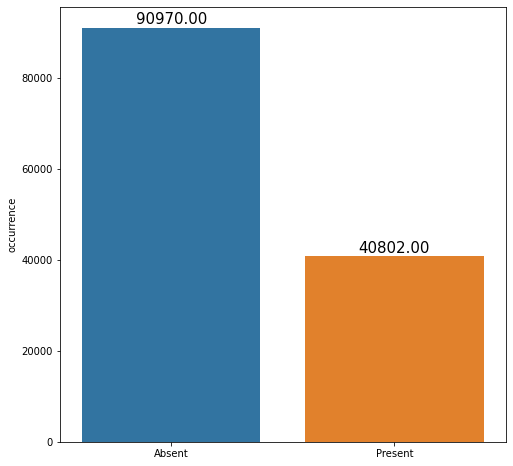

In [12]:
# check the occurrence column
plt.figure(figsize=(8, 8))
ax = sns.barplot(data=df,x=df["occurrence"].value_counts().index,y=df["occurrence"].value_counts())
ax.set_xticklabels(["Absent","Present"])
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'),(p.get_x() + p.get_width() / 2,p.get_height()), ha='center', va='center',size=15, xytext=(0, 8),textcoords='offset points')
plt.show()

In [13]:
# map to see based on decimalLatitude and decimalLongtitude for frog occurrence


fig = px.scatter_geo(df,lat='decimalLatitude',lon='decimalLongitude',color="occurrence", center = dict(lat= -80 , lon=170),
                     hover_name="stateProvince",width=800)
fig.update_layout(title = 'Frog occurrence', title_x=0.5)
fig.show()

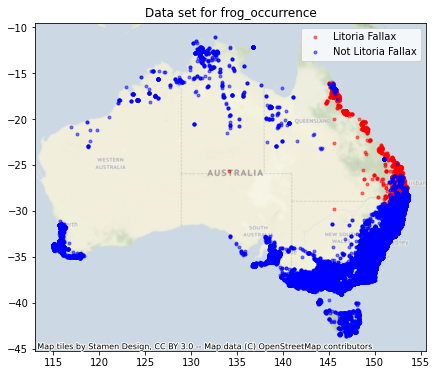

In [14]:
def map_dataset(target_species,data_name):
  fig, ax = plt.subplots(figsize = (7, 7))

  filt = df.occurrence == 1
  ax.scatter(df[filt].decimalLongitude, df[filt].decimalLatitude,
            color = 'red', marker='.', alpha=0.5, label=target_species)
  ax.scatter(df[~filt].decimalLongitude, df[~filt].decimalLatitude,
            color = 'blue', marker='.', alpha=0.5, label=f"Not {target_species}")
  ax.legend()
  cx.add_basemap(ax, crs={'init':'epsg:4326'}, alpha=0.5)
  ax.set_title(f"Data set for {data_name}")

map_dataset(target_species,"frog_occurrence")

In [15]:
# create a key for the occurrence dataset 
target_species_frog_data = df[df.occurrence == 1]
df = (
    df
    [lambda x: x.occurrence == 0]
    .sample(
        len(target_species_frog_data), random_state=420
    )
    .append(target_species_frog_data)
    # assign key for joining purposes
    .reset_index(drop=True)
    .assign(key=lambda x: x.index)
)

### Deal with na for state province column. 
remove the stateProvince Column because it is not important however, the row data from Decimallatitude and DecimalLongtitude is important. 

In [16]:
# deal with na for state province column 
# remove the stateProvince Column because it is not important however, the row data fro 
df.dropna(axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81604 entries, 0 to 81603
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gbifID            81604 non-null  int64  
 1   eventDate         81604 non-null  object 
 2   country           81604 non-null  object 
 3   continent         81604 non-null  object 
 4   decimalLatitude   81604 non-null  float64
 5   decimalLongitude  81604 non-null  float64
 6   occurrence        81604 non-null  int64  
 7   key               81604 non-null  int64  
dtypes: float64(2), int64(3), object(3)
memory usage: 5.0+ MB


In [17]:
minlatitude, maxlatitude = df["decimalLatitude"].min(),df["decimalLatitude"].max()
minlongtitude, maxlongtitude = df["decimalLongitude"].min(), df["decimalLongitude"].max()
startDate, endDate = df["eventDate"].min(), df["eventDate"].max()
# min_lon, min_lat = (150.15, -34.25)  # Lower-left corner
# max_lon, max_lat = (151.15, -33.25)  # Upper-right corner
# bbox = (min_lon, min_lat, max_lon, max_lat)
bbox = (minlongtitude, minlatitude, maxlongtitude, maxlatitude)
time_slice = (str(startDate),str(endDate))

## Predictor Variables 

After dealing with our response variable, now it is time to deal with predictor variables. Now, we need to access the TerraClimate Dataset 

In [18]:
def get_terraclimate(bbox, metrics, time_slice=None, assets=None, features=None, interp_dims=None, verbose=True):
    """Returns terraclimate metrics for a given area, allowing results to be interpolated onto a larger image.
    
    params :
    bbox -- Tuple of (min_lon, min_lat, max_lon, max_lat) to define area
    metrics -- Nested dictionary in the form {<metric_name>:{'fn':<metric_function>,'params':<metric_kwargs_dict>}, ... }
    time_slice -- Tuple of datetime strings to select data between, e.g. ('2015-01-01','2019-12-31')
    assets -- list of terraclimate assets to take
    features -- list of asset metrics to take, specified by strings in the form '<asset_name>_<metric_name>'
    interp_dims -- Tuple of dimensions (n, m) to interpolate results to
    """
    collection = pystac.read_file("https://planetarycomputer.microsoft.com/api/stac/v1/collections/terraclimate")
    asset = collection.assets["zarr-https"]
    store = fsspec.get_mapper(asset.href)
    data = xr.open_zarr(store, **asset.extra_fields["xarray:open_kwargs"])
    minlongtitude, minlatitude, maxlongtitude, maxlatitude = bbox
    # Select datapoints that overlap region
    if time_slice is not None:
        data = data.sel(lon=slice(minlongtitude,maxlongtitude),lat=slice(maxlatitude,minlatitude),time=slice(time_slice[0],time_slice[1]))
    else:
        data = data.sel(lon=slice(minlongtitude,maxlongtitude),lat=slice(maxlatitude,minlatitude))
    if assets is not None:
        data = data[assets]
    print('Loading data') if verbose else None
    data = data.rename(lat='y', lon='x').to_array().compute()
        
    # Calculate metrics
    combined_values = []
    combined_bands = []
    for name, metric in metrics.items():
        print(f'Calculating {name}') if verbose else None
        sum_data = xr.apply_ufunc(
            metric['fn'], data, input_core_dims=[["time"]], kwargs=metric['params'], dask = 'allowed', vectorize = True
        ).rename(variable='band')
        xcoords = sum_data.x
        ycoords = sum_data.y
        dims = sum_data.dims
        combined_values.append(sum_data.values)
        for band in sum_data.band.values:
            combined_bands.append(band+'_'+name)
        
    # Combine metrics
    combined_values = np.concatenate(
        combined_values,
        axis=0
    )
    combined_data = xr.DataArray(
        data=combined_values,
        dims=dims,
        coords=dict(
            band=combined_bands,
            y=ycoords,
            x=xcoords
        )
    )    

    # Take relevant bands:
    combined_data = combined_data.sel(band=features)

    if interp_dims is not None:
        print(f'Interpolating image') if verbose else None
        interp_coords = (np.linspace(bbox[0], bbox[2], interp_dims[0]), np.linspace(bbox[1], bbox[3], interp_dims[1]))
        combined_data = combined_data.interp(x=interp_coords[0], y=interp_coords[1], method='nearest', kwargs={"fill_value": "extrapolate"})

    return combined_data

In [19]:
tc_metrics = {
    'mean':{
        'fn':np.nanmean,
        'params':{}
    },
    'min':{
        'fn':np.nanmin,
        'params':{}
    },
    'max':{
        'fn':np.nanmax,
        'params':{}
    }
}

# Measurements to take
assets=['tmax', 'tmin', 'ppt', 'soil','aet','vap','vpd','pet','def','swe','ws']



# Features to take, in form '<asset>_<metric>'
features=['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean','aet_mean','vap_mean','vpd_mean','pet_mean','def_mean','swe_mean','ws_mean']

# Interpolate values to a 512x512 image
interp_dims = (512, 512)

weather_data = get_terraclimate(bbox, tc_metrics, time_slice, assets=assets, features=features, interp_dims=interp_dims)
display(weather_data.band.values)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xarray/backends/plugins.py:61: RuntimeWarning:

Engine 'cfgrib' loading failed:
Cannot find the ecCodes library



Loading data
Calculating mean


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/numpy/lib/function_base.py:2277: RuntimeWarning:

Mean of empty slice



Calculating min


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/numpy/lib/function_base.py:2277: RuntimeWarning:

All-NaN slice encountered



Calculating max
Interpolating image


array(['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean',
       'vap_mean', 'vpd_mean', 'pet_mean', 'def_mean', 'swe_mean',
       'ws_mean'], dtype='<U9')

### Visualization 

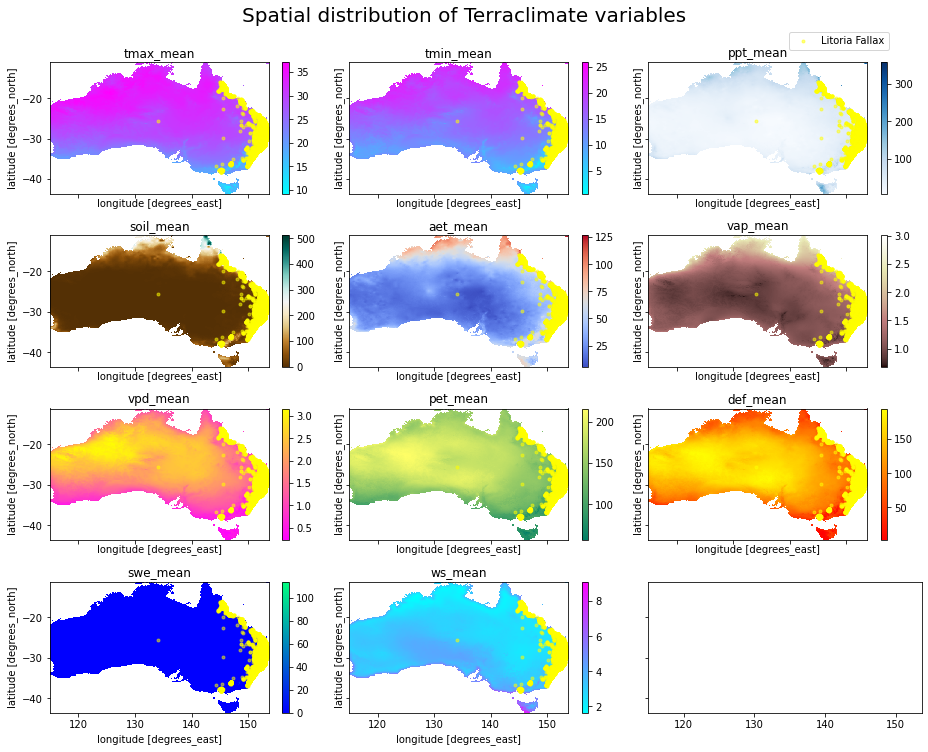

In [20]:
# visualizing the spartial distribution 
nrow = 4
ncol = 3
fig, ax = plt.subplots(nrow, ncol, figsize=(13, 10), sharex=True, sharey=True)

bands = weather_data.band.values
filt = df.occurrence == 1
cmaps = ["cool", "cool", "Blues", "BrBG","coolwarm", 'pink', 'spring', 'summer', 'autumn', 'winter', 'cool',
                      'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper']

for i in range(len(bands)):
    xr.plot.imshow(weather_data[i], 'x', 'y', cmap=cmaps[i], ax=ax[i//ncol, i%ncol]) 
    ax[i//ncol, i%ncol].set_title(bands[i])
    ax[i//ncol, i%ncol].scatter(df[filt].decimalLongitude, df[filt].decimalLatitude,
                                color = 'yellow', marker='.', alpha=0.5, label=target_species if i==0 else '')

fig.suptitle("Spatial distribution of Terraclimate variables", fontsize=20,y=1.04)
fig.legend(loc=(0.85, 0.933))
plt.tight_layout()
plt.show()

From the spartial distribution, we mainly can see that the spartial distribution of each features are mainly on the east side of Australia where mainly the litora Fallax species appear. 

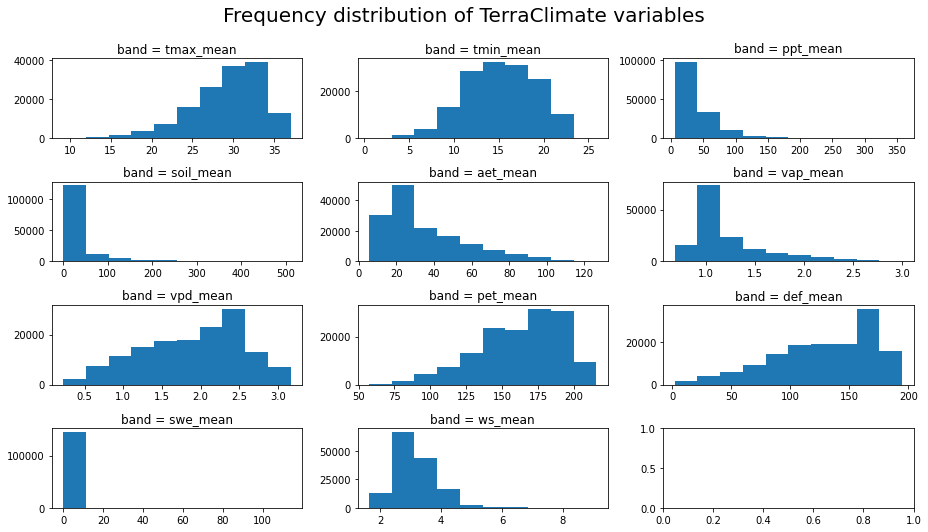

In [21]:
# check the distribution of the prediction data 
nrow = 4
ncol = 3
fig, ax = plt.subplots(nrow, ncol, figsize=(13, 7))

bands = weather_data.band.values

for i in range(len(bands)):
    xr.plot.hist(weather_data[i], ax=ax[i//ncol, i%ncol])

fig.suptitle("Frequency distribution of TerraClimate variables",  fontsize=20,y=1.05)
plt.tight_layout()
plt.show()

From the above 4 histograms, we can see that 4 features are all skewness dataset, which mean there is a high outliers especially in ppt_mean and soil_mean. 

## Feature engineering 

In [22]:
def join_frogs(frogs, data):
    """Collects the data for each frog location and joins it onto the frog data 

    params:
    frogs -- dataframe containing the response variable along with ["decimalLongitude", "decimalLatitude", "key"]
    data -- xarray dataarray of features, indexed with geocoordinates
    """
    return frogs.merge(
        (
            data
            .rename('data')
            .sel(
                x=xr.DataArray(frogs.decimalLongitude, dims="key", coords={"key": frogs.key}), 
                y=xr.DataArray(frogs.decimalLatitude, dims="key", coords={"key": frogs.key}),
                method="nearest"
            )
            .to_dataframe()
            .assign(val = lambda x: x.iloc[:, -1])
            [['val']]
            .reset_index()
            .drop_duplicates()
            .pivot(index="key", columns="band", values="val")
            .reset_index()
        ),
        on = ['key'],
        how = 'inner'
    )
    
model_data = join_frogs(df, weather_data)
model_data.head() # join the final data between predicted and response variable 

,gbifID,eventDate,country,continent,decimalLatitude,decimalLongitude,occurrence,key,aet_mean,def_mean,pet_mean,ppt_mean,soil_mean,swe_mean,tmax_mean,tmin_mean,vap_mean,vpd_mean,ws_mean
0,1915930801,2017-10-26,Australia,Australia,-32.672500,151.391100,0,0,57.321429,55.672619,113.029762,60.285714,31.023810,0.0,24.659525,11.813692,1.382143,0.905119,2.830952
1,3463559335,2020-09-04,Australia,Australia,-35.976300,147.841000,0,1,56.428571,52.636905,109.029762,61.357143,72.851190,0.0,21.904168,7.783334,1.079464,0.862500,3.099405
2,3108952716,2018-06-21,Australia,Australia,-33.755539,151.166564,0,2,80.589286,30.154762,110.672619,94.190476,80.982143,0.0,23.052382,12.886906,1.427619,0.747679,3.773810
3,3463682992,2019-11-08,Australia,Australia,-38.301966,144.160770,0,3,44.214286,55.392857,99.625000,46.934524,17.928571,0.0,19.082740,9.810121,1.157202,0.571310,5.568452
4,3463702778,2019-09-30,Australia,Australia,-31.776300,115.986000,0,4,45.720238,96.291667,142.017857,50.690476,43.601190,0.0,25.168454,12.508335,1.296667,1.127798,4.019643


Some columns are not importants after do the merging, therefore it needs to be drops and only left with important columns. 

In [23]:
# check if any na in the response variable 
model_data.isna().sum()

gbifID                0
eventDate             0
country               0
continent             0
decimalLatitude       0
decimalLongitude      0
occurrence            0
key                   0
aet_mean            478
def_mean            478
pet_mean            478
ppt_mean            478
soil_mean           478
swe_mean            478
tmax_mean           478
tmin_mean           478
vap_mean            478
vpd_mean            478
ws_mean             478
dtype: int64

From the above, we can see that the response variable have some missing data, therefore we need to compute the dataset. In this case, since the response have a strong outlier happen, we will perform an interpolation to fill the missing na 

In [24]:
def interpolate(df,col_list):
  for x in col_list:
    df[x] = df[x].interpolate(methods="polynomial",order=4)
  return df

In [25]:
# get all the columns name that are na 
na_col = [x for x in model_data.columns if model_data[x].isnull().sum() != 0]
df = interpolate(model_data,na_col)

In [26]:
model_data.isnull().sum()

gbifID              0
eventDate           0
country             0
continent           0
decimalLatitude     0
decimalLongitude    0
occurrence          0
key                 0
aet_mean            0
def_mean            0
pet_mean            0
ppt_mean            0
soil_mean           0
swe_mean            0
tmax_mean           0
tmin_mean           0
vap_mean            0
vpd_mean            0
ws_mean             0
dtype: int64

In [27]:
def drop_col(final_df,list_col):
  final_df.drop(columns=list_col,axis=1,inplace=True)
  
  
drop_col(df,["gbifID","eventDate","country","continent","key",'decimalLatitude','decimalLongitude'])

In [28]:
# we need to split the dataset into X and y 
X = df.drop(columns=["occurrence"])
y = df[["occurrence"]]

In [29]:
def dealing_imbalance(X,y,over,synthetic=False):
  '''
  function to perform to deal with imbalance dataset 
  params:
  X:         the predicted variables
  y;         the target variable
  over:      boolean for whether we want to oversampling or undersampling 
  synthetic: boolearn for whether we want to sample synthetically 
  '''
  overrandom = RandomOverSampler(sampling_strategy='minority')
  underrandom = RandomUnderSampler(sampling_strategy='majority') 
  smote = SMOTE()
  
  if synthetic == False:
    if over==True:
      
      X,y = overrandom.fit_resample(X,y)
      
    elif over == False:
      X,y = underrandom.fit_resample(X,y)
      
  elif synthetic == True:
    X,y = smote.fit_resample(X,y)
    
  return X,y

In [30]:
def scale_dataset(X,y,test=False):
  '''
  create a pipeline to perform the scaling and finally split into train and test set 
  params:
  X:         the predicted resample variables
  y:         the target resample variable
  '''
  scaler = RobustScaler()
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  X_train_scale = scaler.fit_transform(X_train)
  if test == False:
    X_test_scale = scaler.transform(X_test)
    return X_train_scale,X_test_scale,y_train,y_test
  else:
    X_test_scale = scaler.transform(X)
    return X_test_scale,y
  
  

In [31]:
X_res, y_res = dealing_imbalance(X,y,True)
X_train_scale,X_test_scale,y_train,y_test = scale_dataset(X_res,y_res)

## Model Prediction and Evaluation 

In [32]:
# create a function to perform the model fitting 
def fitting_model(x_train,y_train,x_test,model):
  model.fit(x_train,y_train)
  y_predict = model.predict(x_test)
  model_name = type(model).__name__
  return y_predict,model,model_name

In [33]:
def predicting_model(X,model):
  y_predict = model.predict(X)
  return y_predict,model

In [34]:
# create a function to perform grid search to search for the best parameter 
def search_parameter(model, x, y,parameter,cross_fold):
  param = parameter
  model_classifer = GridSearchCV(model,param,cv=cross_fold)
  model_classifer.fit(x,y)
  y_predict = model_classifer.predict(x)
  return y_predict,model_classifer.best_params_

In [35]:
# function to evaluate the model 
def model_evaluation(y,y_predict,name):
  accuracy = accuracy_score(y,y_predict)
  precision = precision_score(y,y_predict)
  recall = recall_score(y,y_predict)
  f1score = f1_score(y,y_predict)
  print(f"{name} have Accuracy {accuracy}, Precision {precision}, Recall {recall}, F1_score {f1score}")

In [36]:
# function to plot the confusion matrix 
def plot_confusion_matrix(y,y_predict1,y_predict2,y_predict3, y_predict4,y_predict5,y_predict6,name1,name2,name3,name4,name5,name6):
  fig, axes = plt.subplots(3,2,figsize=(10,10),)
  confusion1 = confusion_matrix(y,y_predict1)
  confusion2 = confusion_matrix(y,y_predict2)
  confusion3 = confusion_matrix(y,y_predict3)
  confusion4 = confusion_matrix(y,y_predict4)
  confusion5 = confusion_matrix(y,y_predict5)
  confusion6 = confusion_matrix(y,y_predict6)
  ax1 = sns.heatmap(confusion1,cmap="coolwarm",annot=True,fmt='g',ax=axes[0,0])
  ax2 = sns.heatmap(confusion2,cmap="coolwarm",annot=True,fmt='g',ax=axes[0,1])
  ax3 = sns.heatmap(confusion3,cmap="coolwarm",annot=True,fmt='g',ax=axes[1,0])
  ax4 = sns.heatmap(confusion4,cmap="coolwarm",annot=True,fmt='g',ax=axes[1,1])
  ax5 = sns.heatmap(confusion5,cmap="coolwarm",annot=True,fmt='g',ax=axes[2,0])
  ax6 = sns.heatmap(confusion6,cmap="coolwarm",annot=True,fmt='g',ax=axes[2,1])
  ax1.title.set_text(name1)
  ax2.title.set_text(name2)
  ax3.title.set_text(name3)
  ax4.title.set_text(name4)
  ax5.title.set_text(name5)
  ax6.title.set_text(name6)
  plt.suptitle("Model Comparision",y=1,fontsize=14)
  plt.show()

In [37]:
# get the probability for each model 
def get_probability(X_test,random_tune,logic1,sgd=None,svc=None,voting=None):
  model_preds = []
  if voting != None or svc != None or sgd != None :
    model_names = ["Random Forest","Logistic Regression","Stochastic Gradient","SVC","Voting Classifier"]
    random_probs = random_tune.predict_proba(X_test)
    random_preds = random_probs[:,1]
    model_preds.append(random_preds)
    logic_prob = logic1.predict_proba(X_test)
    logic_preds = logic_prob[:,1]
    model_preds.append(logic_preds)
    sgd_prob = sgd.predict_proba(X_test)
    sgd_preds = sgd_prob[:,1]
    model_preds.append(sgd_preds)
    svc_prob = svc.predict_proba(X_test)
    svc_preds = svc_prob[:,1]
    model_preds.append(svc_preds)
    voting_prob = voting.predict_proba(X_test)
    voting_preds = voting_prob[:,1]
    model_preds.append(voting_preds)
  else:
    model_names = ["Random Forest","Logistic Regression","Stochastic Gradient"]
    random_probs = random_tune.predict_proba(X_test)
    random_preds = random_probs[:,1]
    model_preds.append(random_preds)
    logic_prob = logic1.predict_proba(X_test)
    logic_preds = logic_prob[:,1]
    model_preds.append(logic_preds)
  return model_preds, model_names

In [38]:
# function to plot the roc 
def plot_roc(y_test,model_preds,model_names):
  colors = ['r','b','c','y','w','k']
  for x in range(len(model_preds)):
    fpr, tpr, threshold = roc_curve(y_test, model_preds[x])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, colors[x], label = "{0}: {1:0.2f}".format(model_names[x],roc_auc))
  plt.title('UFC')
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

In [39]:
logic = LogisticRegression(solver='sag')
svc = SVC(kernel="rbf",C=0.8,gamma=2,random_state=42)
random = RandomForestClassifier(max_depth=10,min_samples_split=5,n_jobs=-1,random_state=42)
sgd = SGDClassifier(n_jobs=-1,random_state=42)
ada = AdaBoostClassifier(SGDClassifier(loss="log"),n_estimators=5,learning_rate=3)
estimators = [('lr',logic),('svm',svc),('random',random),('sgd',sgd)]
voting = VotingClassifier(estimators=estimators,n_jobs=-1)
logic_predict, logic_model, logic_name = fitting_model(X_train_scale,y_train,X_test_scale,logic)
svc_predict, svc_model, svc_name = fitting_model(X_train_scale,y_train,X_test_scale,svc)
random_predict, random_model,random_name = fitting_model(X_train_scale,y_train,X_test_scale,random)
sgd_predict, sgd_model, sgd_name = fitting_model(X_train_scale,y_train,X_test_scale,sgd)
voting_predict, voting_model,voting_name = fitting_model(X_train_scale,y_train,X_test_scale,voting)
ada_predict,ada_model,ada_name = fitting_model(X_train_scale,y_train,X_test_scale,ada)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/var/folders/kh/t3f3nz0s3sv8b5wd8967z8t40000gn/T/ipykernel_44325/2091263406.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Library/Frameworks/Pytho

In [40]:
def create_model(learning_rate,dropout_rate,activation): 
  model = Sequential()
  model.add(Dense(700,activation=activation,kernel_initializer="random_normal"))
  model.add(Dropout(dropout_rate))
  model.add(Dense(500,activation=activation))
  model.add(Dropout(dropout_rate))
  model.add(Dense(300,activation=activation))
  model.add(Dropout(dropout_rate))
  model.add(Dense(100,activation=activation))
  model.add(Dropout(dropout_rate))
  model.add(Dense(1, activation="sigmoid"))
  adam = Adam(learning_rate=learning_rate)
  model.compile(loss="binary_crossentropy",optimizer=adam,metrics=["accuracy"])

  return model

In [41]:
X_train1, X_validation, y_train1, y_validation = train_test_split(X_train_scale, y_train, test_size=0.2, random_state=42)
early_stop = EarlyStopping(monitor="val_accuracy",mode="max",verbose=1,patience=15)
mlp_model = create_model(learning_rate=0.001,dropout_rate=0.2,activation='relu')
mlp_model.fit(X_train1,y_train1,epochs=100,validation_data=(X_validation,y_validation),callbacks=[early_stop])

Epoch 1/100


2022-06-01 21:57:21.197320: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1633/1633 [==============================] - 15s 8ms/step - loss: 0.3960 - accuracy: 0.8063 - val_loss: 0.3798 - val_accuracy: 0.8241
Epoch 2/100
1633/1633 [==============================] - 15s 9ms/step - loss: 0.3688 - accuracy: 0.8251 - val_loss: 0.3518 - val_accuracy: 0.8354
Epoch 3/100
1633/1633 [==============================] - 13s 8ms/step - loss: 0.3616 - accuracy: 0.8314 - val_loss: 0.3518 - val_accuracy: 0.8348
Epoch 4/100
1633/1633 [==============================] - 12s 7ms/step - loss: 0.3568 - accuracy: 0.8358 - val_loss: 0.3518 - val_accuracy: 0.8389
Epoch 5/100
1633/1633 [==============================] - 12s 7ms/step - loss: 0.3538 - accuracy: 0.8376 - val_loss: 0.3468 - val_accuracy: 0.8364
Epoch 6/100
1633/1633 [==============================] - 13s 8ms/step - loss: 0.3521 - accuracy: 0.8385 - val_loss: 0.3469 - val_accuracy: 0.8402
Epoch 7/100
1633/1633 [==============================] - 13s 8ms/step - loss: 0.3507 - accuracy: 0.8387 - val_loss: 0.3419 - val_accurac

In [42]:
y_mlp_pred = mlp_model.predict(X_test_scale)
y_mlp_pred = np.where(y_mlp_pred.ravel() <= 0.5,0,1)

511/511 [==============================] - 1s 3ms/step


In [43]:
model_evaluation(y_test,logic_predict,logic_name)
model_evaluation(y_test,svc_predict,svc_name)
model_evaluation(y_test,sgd_predict,sgd_name)
model_evaluation(y_test,random_predict,random_name)
model_evaluation(y_test,voting_predict,voting_name)
model_evaluation(y_test,ada_predict,ada_name)
model_evaluation(y_test,y_mlp_pred,'Neural Network')

LogisticRegression have Accuracy 0.7909441823417682, Precision 0.731645072634472, Recall 0.9166256763403837, F1_score 0.813755458515284
SVC have Accuracy 0.845536425464126, Precision 0.8116875902677481, Recall 0.8984259714707329, F1_score 0.8528570594758653
SGDClassifier have Accuracy 0.7936400955823786, Precision 0.7193370165745856, Recall 0.9606492867683227, F1_score 0.8226621735467564
RandomForestClassifier have Accuracy 0.8487225047484835, Precision 0.8131151166648236, Recall 0.9042056074766355, F1_score 0.8562445414847161
VotingClassifier have Accuracy 0.8394093499172844, Precision 0.8111098566105905, Recall 0.8834235120511559, F1_score 0.8457237035729002
AdaBoostClassifier have Accuracy 0.7890447889222474, Precision 0.7466596528143082, Recall 0.8727250368912937, F1_score 0.8047853943414413
Neural Network have Accuracy 0.8453526131977207, Precision 0.8114863363696956, Recall 0.8983030004918839, F1_score 0.8526905567876736


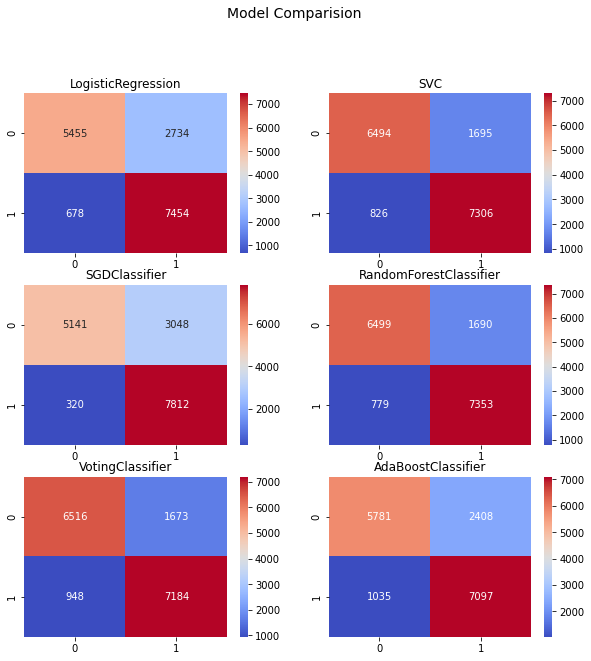

In [44]:
plot_confusion_matrix(y_test,logic_predict,svc_predict,sgd_predict,random_predict,voting_predict,ada_predict,logic_name,svc_name,sgd_name,random_name,voting_name,ada_name)


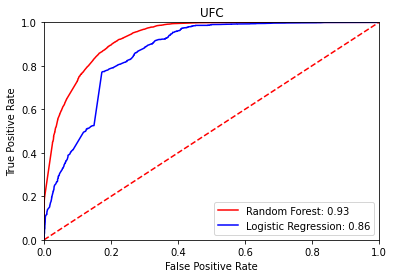

In [45]:
model_preds, model_names = get_probability(X_test_scale,random_model,logic_model)
plot_roc(y_test,model_preds,model_names)

In [ ]:
# logic_param = {"C":[0.001,0.05,0.01],"solver":["‘lbfgs","sag","saga"],"max_iter":[1000,1500,2000]}
# logic_y, logic_best_param = search_parameter(LogisticRegression(n_jobs=-1),X_train_scale,y_train,logic_param,3)
# print(logic_best_param)

# tree_param = {"criterion":["gini","entropy"],"max_depth":[10,15,20,22],
#             "min_samples_leaf":[4,5,6,7]}
# random_y, random_best_param = search_parameter(RandomForestClassifier(n_estimators=10,n_jobs=-1),X_train_scale, y_train,tree_param,3)
# print(random_best_param)

# param = {"C":[0.05,0.5],"kernel":["linear","rbf"],"gamma":[2,3]}
# svc_y, svc_best_param = search_parameter(SVC(),X_train_scale,y_train,param,2)
# print(svc_best_param)

# sgd_param = {'alpha':[10.0e-04, 10.0e-05, 10.0e-07], 'penalty':['l1', 'l2'], 'l1_ratio':[0.075, 0.15, 0.30],'loss':['hinge','log','perceptron']}
# sgd_y, sgd_best_param = search_parameter(SGDClassifier(n_jobs=-1),X_train_scale,y_train,sgd_param,3)
# print(sgd_best_param)

# ada_param = {'learning_rate':[0.01,1,3],'n_estimators':[5,10,20]}
# ada_y, ada_best_param = search_parameter(AdaBoostClassifier(SGDClassifier(loss="log",alpha=0.0001,l1_ratio=0.075,penalty='l1',random_state=42,n_jobs=-1)),X_train_scale,y_train,ada_param,3)
# print(ada_best_param)

# tune_model= KerasClassifier(build_fn=create_model)
# dropout_rate = [0.15,0.2,0.3]
# learning_rate = [0.001,0.005,0.003]
# activation = ["relu","elu",'selu']
# para_grid = dict(dropout_rate=dropout_rate,learning_rate=learning_rate,activation=activation)
# grid = GridSearchCV(tune_model,para_grid,verbose=1,cv=3,n_jobs=-1)
# grid_result = grid.fit(X_train_scale,y_train)
# print(grid_result.best_params_)

In [47]:
def exponential_decay(lr, s):
  def exponential_decay_fn(epoch):
    return lr * 0.1 ** (epoch/s)
  return exponential_decay_fn

In [51]:
exponential_decay_fn1 = exponential_decay(0.01,20)
exponential_decay_fn2 = exponential_decay(0.01,15)
lr_scheduler_list = [LearningRateScheduler(exponential_decay_fn1),LearningRateScheduler(exponential_decay_fn2)]

In [60]:
def lr_search(X_train,y_train,lr_scheduler_list):
  score = []
  for lr_scheduler in lr_scheduler_list:
    check_lr_model = create_model(learning_rate=0.001,dropout_rate=0.15,activation='relu')
    check_lr_model.fit(X_train,y_train,epochs=100,validation_data=(X_validation,y_validation),callbacks=[early_stop,lr_scheduler])
    score.append({lr_scheduler.optimizer.lr.numpy():[check_lr_model.evaluate(X_train,y_train)]})
  return score

In [53]:
score = lr_search(X_train_scale,y_train,lr_scheduler_list)

Epoch 1/100
2041/2041 [==============================] - 15s 7ms/step - loss: 0.4421 - accuracy: 0.7909 - val_loss: 0.4150 - val_accuracy: 0.8055 - lr: 0.0100
Epoch 2/100
2041/2041 [==============================] - 15s 8ms/step - loss: 0.4222 - accuracy: 0.8025 - val_loss: 0.3818 - val_accuracy: 0.7937 - lr: 0.0089
Epoch 3/100
2041/2041 [==============================] - 15s 7ms/step - loss: 0.3994 - accuracy: 0.8078 - val_loss: 0.3658 - val_accuracy: 0.8220 - lr: 0.0079
Epoch 4/100
2041/2041 [==============================] - 13s 7ms/step - loss: 0.3928 - accuracy: 0.8143 - val_loss: 0.3620 - val_accuracy: 0.8306 - lr: 0.0071
Epoch 5/100
2041/2041 [==============================] - 13s 7ms/step - loss: 0.3875 - accuracy: 0.8187 - val_loss: 0.3635 - val_accuracy: 0.8328 - lr: 0.0063
Epoch 6/100
2041/2041 [==============================] - 14s 7ms/step - loss: 0.3789 - accuracy: 0.8200 - val_loss: 0.3537 - val_accuracy: 0.8364 - lr: 0.0056
Epoch 7/100
2041/2041 [=======================

In [76]:
# perform the grid search to search for the best hyperparameter 
# logic1 = LogisticRegression(C= 0.001, max_iter= 1000, solver='sag')
# logic_y, logic_model1, logic_name = fitting_model(X_train_scale,y_train,X_test_scale,logic1)

# random1 = RandomForestClassifier(criterion="gini",max_depth=15,min_samples_leaf=4,n_jobs=-1,random_state=42)
# random_y, random_model1,random_name = fitting_model(X_train_scale,y_train,X_test_scale,random1)

# svc1 = SVC(kernel="rbf",C=0.5,gamma=3,probability=True,random_state=42)
# svc_y,svc_model1,svc_name = fitting_model(X_train_scale,y_train,X_test_scale,svc1)

# sgd1 = SGDClassifier(loss="log",alpha=0.0001,l1_ratio=0.075,penalty='l1',random_state=42,n_jobs=-1)
# sgd_y, sgd_model1,sgd_name = fitting_model(X_train_scale,y_train,X_test_scale,sgd1)

# estimators = [('lr',logic1),('svm',svc1),('random',random1),('sgd',sgd1)]
# voting = VotingClassifier(estimators=estimators,voting="soft")
# voting_y, voting_model1,voting_name = fitting_model(X_train_scale,y_train,X_test_scale,voting)

# ada1 = AdaBoostClassifier(sgd1,n_estimators=5,learning_rate=0.01)
# ada_y, ada_model1, ada_name = fitting_model(X_train_scale,y_train,X_test_scale,ada1)

mlp_model1 = create_model(learning_rate=0.001,dropout_rate=0.15,activation='relu')
mlp_model1.fit(X_train1,y_train1,epochs=100,validation_data=(X_validation,y_validation),callbacks=[early_stop,lr_scheduler_list[1]])
mlp_y = mlp_model1.predict(X_test_scale)
mlp_y = np.where(mlp_y.ravel() <= 0.5,0,1)

Epoch 1/100
1633/1633 [==============================] - 13s 7ms/step - loss: 0.4607 - accuracy: 0.7867 - val_loss: 0.4604 - val_accuracy: 0.7978 - lr: 0.0100
Epoch 2/100
1633/1633 [==============================] - 12s 7ms/step - loss: 0.4300 - accuracy: 0.7944 - val_loss: 0.4159 - val_accuracy: 0.7972 - lr: 0.0086
Epoch 3/100
1633/1633 [==============================] - 11s 7ms/step - loss: 0.4258 - accuracy: 0.7994 - val_loss: 0.4017 - val_accuracy: 0.8055 - lr: 0.0074
Epoch 4/100
1633/1633 [==============================] - 11s 7ms/step - loss: 0.4104 - accuracy: 0.8052 - val_loss: 0.3780 - val_accuracy: 0.8268 - lr: 0.0063
Epoch 5/100
1633/1633 [==============================] - 13s 8ms/step - loss: 0.3943 - accuracy: 0.8126 - val_loss: 0.3794 - val_accuracy: 0.8001 - lr: 0.0054
Epoch 6/100
1633/1633 [==============================] - 11s 7ms/step - loss: 0.3820 - accuracy: 0.8167 - val_loss: 0.3587 - val_accuracy: 0.8308 - lr: 0.0046
Epoch 7/100
1633/1633 [=======================

In [78]:
model_evaluation(y_test,logic_y,logic_name)
model_evaluation(y_test,random_y,random_name)
model_evaluation(y_test,svc_y,svc_name)
model_evaluation(y_test,sgd_y,sgd_name)
model_evaluation(y_test,voting_y,voting_name)
model_evaluation(y_test,ada_y,ada_name)
model_evaluation(y_test,y_mlp_pred,'Neural Network')

LogisticRegression have Accuracy 0.7779547821824643, Precision 0.7163563063927817, Recall 0.9177324151500246, F1_score 0.8046361185983828
RandomForestClassifier have Accuracy 0.8493964830586361, Precision 0.818334829443447, Recall 0.896827348745696, F1_score 0.8557850269889696
SVC have Accuracy 0.845107530175847, Precision 0.8127232142857143, Recall 0.8954746679783571, F1_score 0.8520945471565644
SGDClassifier have Accuracy 0.7894736842105263, Precision 0.7296557120500783, Recall 0.9173635022134776, F1_score 0.8128132490738722
VotingClassifier have Accuracy 0.8452300716867839, Precision 0.8105473077775316, Recall 0.8996556812592228, F1_score 0.8527800442942067
AdaBoostClassifier have Accuracy 0.49825378346915017, Precision 0.49825378346915017, Recall 1.0, F1_score 0.6651126651126652
Neural Network have Accuracy 0.8453526131977207, Precision 0.8114863363696956, Recall 0.8983030004918839, F1_score 0.8526905567876736


After performing grid search,from the evaluation above, we can see that in general, SVC and Voting classifier have a better result compare to the other 2. 

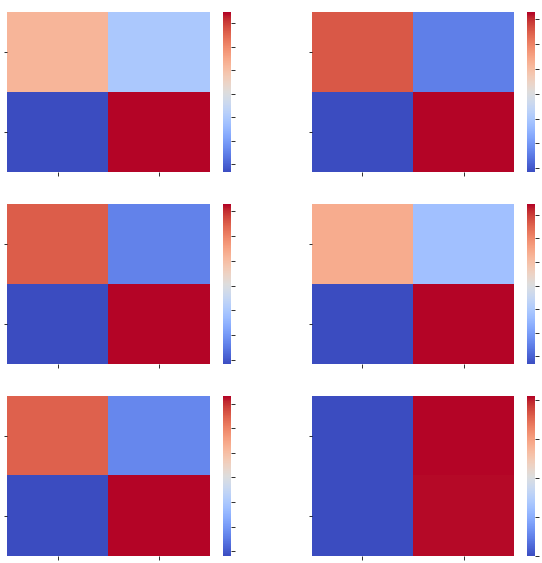

In [80]:
plot_confusion_matrix(y_test,logic_y,random_y,svc_y,sgd_y,voting_y,ada_y,logic_name,random_name,svc_name,sgd_name,voting_name,ada_name)

From the confusion matrix, we can see that SVC or Voting classifier predict a better dataset. If we compared the true positive of the 4, we can see that SVC and voting classifier have a higher. 

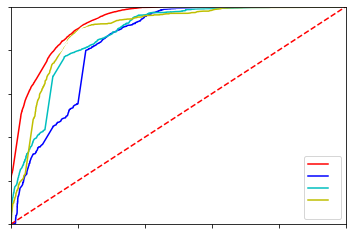

In [81]:
model_preds, model_names = get_probability(X_test_scale,random_model1,logic_model1,sgd_model1,svc_model1,voting_model1)
plot_roc(y_test,model_preds,model_names)

From the ROC curve above, we can see that Voting Classifier by far is the best model to make prediction. Based on the above metrics comparision, and confusion matrix, we can see that Voting Classifier have the highest True Positive and the highest F1 score. Therefore, we will used voting classifier as a our main model to make prediction and for the final dataset and compare with the other 4 models. 

## Submission

In [82]:
# read in the final test dataset 
final = pd.read_csv("Level_1_challenge_1_submission_template.csv")
final.head()


,id,decimalLatitude,decimalLongitude,occurrenceStatus
0,0,-37.917146,145.207706,NaN
1,1,-37.750974,144.981501,NaN
2,2,-37.961600,145.348000,NaN
3,3,-37.621300,145.003000,NaN
4,4,-38.498100,145.647000,NaN


In [83]:
minlatitude, maxlatitude = final["decimalLatitude"].min(),final["decimalLatitude"].max()
minlongtitude, maxlongtitude = final["decimalLongitude"].min(), final["decimalLongitude"].max()
bbox = (minlongtitude, minlatitude, maxlongtitude, maxlatitude)
weather_data1 = get_terraclimate(bbox, tc_metrics, time_slice, assets=assets, features=features, interp_dims=interp_dims)
display(weather_data1.band.values)

Loading data
Calculating mean


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/numpy/lib/function_base.py:2277: RuntimeWarning:

Mean of empty slice



Calculating min


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/numpy/lib/function_base.py:2277: RuntimeWarning:

All-NaN slice encountered



Calculating max
Interpolating image


array(['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean',
       'vap_mean', 'vpd_mean', 'pet_mean', 'def_mean', 'swe_mean',
       'ws_mean'], dtype='<U9')

In [84]:
def join_test(frogs, data):
    """Collects the data for each frog location and joins it onto the frog data 

    params:
    frogs -- dataframe containing the response variable along with ["decimalLongitude", "decimalLatitude", "key"]
    data -- xarray dataarray of features, indexed with geocoordinates
    """
    return frogs.merge(
        (
            data
            .rename('data')
            .sel(
                x=xr.DataArray(frogs.decimalLongitude, dims="id", coords={"id": frogs.id}), 
                y=xr.DataArray(frogs.decimalLatitude, dims="id", coords={"id": frogs.id}),
                method="nearest"
            )
            .to_dataframe()
            .assign(val = lambda x: x.iloc[:, -1])
            [['val']]
            .reset_index()
            .drop_duplicates()
            .pivot(index="id", columns="band", values="val")
            .reset_index()
        ),
        on = ['id'],
        how = 'inner'
    )
    
final_data = join_test(final, weather_data1)
final_data.head()

,id,decimalLatitude,decimalLongitude,occurrenceStatus,aet_mean,def_mean,pet_mean,ppt_mean,soil_mean,swe_mean,tmax_mean,tmin_mean,vap_mean,vpd_mean,ws_mean
0,0,-37.917146,145.207706,NaN,58.172619,48.696429,106.845238,61.470238,50.392857,0.0,20.543454,10.209525,1.155952,0.713929,4.682143
1,1,-37.750974,144.981501,NaN,49.309524,61.505952,110.761905,51.946429,18.851190,0.0,20.741073,10.218454,1.149524,0.734286,4.976191
2,2,-37.961600,145.348000,NaN,66.428571,32.892857,99.250000,72.880952,102.833333,0.0,19.589287,9.283930,1.123929,0.631845,4.428572
3,3,-37.621300,145.003000,NaN,47.011905,59.357143,106.327381,49.464286,19.946429,0.0,20.225596,9.340478,1.105298,0.711429,4.584524
4,4,-38.498100,145.647000,NaN,66.744048,28.994048,95.720238,77.547619,104.595238,0.0,19.074406,9.654764,1.168988,0.559524,4.985119


In [85]:
final_data.isna().sum()

id                     0
decimalLatitude        0
decimalLongitude       0
occurrenceStatus    4051
aet_mean              49
def_mean              49
pet_mean              49
ppt_mean              49
soil_mean             49
swe_mean              49
tmax_mean             49
tmin_mean             49
vap_mean              49
vpd_mean              49
ws_mean               49
dtype: int64

In [96]:
drop_col(final_data,['id','decimalLatitude','decimalLongitude'])

In [87]:
# get all the columns name that are na 
na_cols = [x for x in final_data.columns if final_data[x].isnull().sum() != 0]
df = interpolate(final_data,na_cols)
final_data.head()


,decimalLatitude,decimalLongitude,occurrenceStatus,aet_mean,def_mean,pet_mean,ppt_mean,soil_mean,swe_mean,tmax_mean,tmin_mean,vap_mean,vpd_mean,ws_mean
0,-37.917146,145.207706,NaN,58.172619,48.696429,106.845238,61.470238,50.392857,0.0,20.543454,10.209525,1.155952,0.713929,4.682143
1,-37.750974,144.981501,NaN,49.309524,61.505952,110.761905,51.946429,18.851190,0.0,20.741073,10.218454,1.149524,0.734286,4.976191
2,-37.961600,145.348000,NaN,66.428571,32.892857,99.250000,72.880952,102.833333,0.0,19.589287,9.283930,1.123929,0.631845,4.428572
3,-37.621300,145.003000,NaN,47.011905,59.357143,106.327381,49.464286,19.946429,0.0,20.225596,9.340478,1.105298,0.711429,4.584524
4,-38.498100,145.647000,NaN,66.744048,28.994048,95.720238,77.547619,104.595238,0.0,19.074406,9.654764,1.168988,0.559524,4.985119


In [91]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4051 entries, 0 to 4050
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   decimalLatitude   4051 non-null   float64
 1   decimalLongitude  4051 non-null   float64
 2   occurrenceStatus  0 non-null      float64
 3   aet_mean          4051 non-null   float64
 4   def_mean          4051 non-null   float64
 5   pet_mean          4051 non-null   float64
 6   ppt_mean          4051 non-null   float64
 7   soil_mean         4051 non-null   float64
 8   swe_mean          4051 non-null   float64
 9   tmax_mean         4051 non-null   float64
 10  tmin_mean         4051 non-null   float64
 11  vap_mean          4051 non-null   float64
 12  vpd_mean          4051 non-null   float64
 13  ws_mean           4051 non-null   float64
dtypes: float64(14)
memory usage: 474.7 KB


In [99]:
X_new = final_data.drop(columns=["occurrenceStatus"])
y_new = final_data[["occurrenceStatus"]]

In [100]:
X_new_scale,y_new_train = scale_dataset(X_new,y_new,True)

In [101]:
new_voting_y,model = predicting_model(X_new_scale,voting_model1)
new_random_y, model = predicting_model(X_new_scale,random_model1)
new_svc_y, model = predicting_model(X_new_scale,svc_model1)
new_logic_y, model = predicting_model(X_new_scale,logic_model1)
new_sgd_y, model = predicting_model(X_new_scale,sgd_model1)
new_ada_y, model = predicting_model(X_new_scale,ada_model1)
new_mlp_y , model = predicting_model(X_new_scale,mlp_model1)
new_mlp_y =  np.where(new_mlp_y.ravel() <= 0.5,0,1)

127/127 [==============================] - 0s 2ms/step


In [108]:
# new_voting_y,model = predicting_model(X_new_scale,voting_model)
# new_random_y, model = predicting_model(X_new_scale,random_model)
# new_svc_y, model = predicting_model(X_new_scale,svc_model)
# new_logic_y, model = predicting_model(X_new_scale,logic_model)
# new_sgd_y, model = predicting_model(X_new_scale,sgd_model)
new_ada_y, model = predicting_model(X_new_scale,ada_model)
# new_mlp_y , model = predicting_model(X_new_scale,mlp_model)
# new_mlp_y =  np.where(new_mlp_y.ravel() <= 0.5,0,1)

In [111]:
drop_col(final,["occurrenceStatus"])
final["occurrenceStatus"] = new_random_y 
# write final to csv for submission 
final.to_csv('challenge_1_submission_benchmark.csv', index=None)